In [1]:
import import_ipynb
import json
import numpy as np
import pandas as pd
import torch as pt
import re
import matplotlib.pyplot as plt
from collections import defaultdict
from glob import glob
from classes_funcs import *

importing Jupyter notebook from classes_funcs.ipynb


In [2]:
input_data_png = 'Appfolio_sample_data/apm_img_0002cf94-5d45-48ef-9ca9-14c7e85ecef1.png'
input_data_boxes = 'Appfolio_sample_data/apm_box_0002cf94-5d45-48ef-9ca9-14c7e85ecef1.csv'
input_data_val_json = 'Appfolio_sample_data/apm_metadata_0002cf94-5d45-48ef-9ca9-14c7e85ecef1.json'

In [5]:
df = pd.read_csv(input_data_boxes)
df[:5]
# df.iloc[:,1:-1]
pared_df = df.drop(columns=['Unnamed: 0', 'space'])
pared_df
df

,Unnamed: 0,x0,x2,y0,y2,page_width,page_height,content,confidence,space
0,0,160,301,58,113,2123,2726,TXU,0.98,\n
1,1,162,288,112,151,2123,2726,energy,0.99,\n
2,2,1813,1965,109,138,2123,2726,11/02/2020,0.99,\n
3,3,198,230,214,250,2123,2726,MB,0.99,
4,4,249,274,214,250,2123,2726,01,0.99,
...,...,...,...,...,...,...,...,...,...,...
407,407,1154,1274,2471,2502,2123,2726,DALLAS,0.99,NaN
408,408,1278,1282,2471,2502,2123,2726,",",0.99,
409,409,1293,1332,2471,2502,2123,2726,TX,0.99,
410,410,1343,1491,2470,2501,2123,2726,75265-0638,0.99,\n


In [29]:
# input_data_val_json
json_file = open(input_data_val_json,'r')
json_data = json.load(json_file)
json_data['AMOUNT']

52.62

In [38]:
def convert_box_json(box_csv, json_file):
    json_file = open(json_file,'r')
    json_data = json.load(json_file)
    
    df = pd.read_csv(box_csv)
    pared_df = df.drop(columns=["Unnamed: 0", "space"])
    dict = {"form": []}
    for idx,text in pared_df.iterrows():
        if (str(json_data['AMOUNT']) in text["content"]):
            dict["form"].append({"box": [text["x0"],text["y2"],text["x2"],text["y0"]], "text": text["content"], "label": "total_value", "words": [{"box": [text["x0"],text["x2"],text["y0"],text["y2"]], "text": text["content"]}], "linking": [], "id": idx})
        else:
            dict["form"].append({"box": [text["x0"],text["y2"],text["x2"],text["y0"]], "text": text["content"], "label": "other", "words": [{"box": [text["x0"],text["x2"],text["y0"],text["y2"]], "text": text["content"]}], "linking": [], "id": idx})
    return dict
    
convert_box_json(input_data_boxes,input_data_val_json)

{'form': [{'box': [160, 113, 301, 58],
   'text': 'TXU',
   'label': 'other',
   'words': [{'box': [160, 301, 58, 113], 'text': 'TXU'}],
   'linking': [],
   'id': 0},
  {'box': [162, 151, 288, 112],
   'text': 'energy',
   'label': 'other',
   'words': [{'box': [162, 288, 112, 151], 'text': 'energy'}],
   'linking': [],
   'id': 1},
  {'box': [1813, 138, 1965, 109],
   'text': '11/02/2020',
   'label': 'other',
   'words': [{'box': [1813, 1965, 109, 138], 'text': '11/02/2020'}],
   'linking': [],
   'id': 2},
  {'box': [198, 250, 230, 214],
   'text': 'MB',
   'label': 'other',
   'words': [{'box': [198, 230, 214, 250], 'text': 'MB'}],
   'linking': [],
   'id': 3},
  {'box': [249, 250, 274, 214],
   'text': '01',
   'label': 'other',
   'words': [{'box': [249, 274, 214, 250], 'text': '01'}],
   'linking': [],
   'id': 4},
  {'box': [299, 250, 397, 214],
   'text': '011793',
   'label': 'other',
   'words': [{'box': [299, 397, 214, 250], 'text': '011793'}],
   'linking': [],
   'id': 

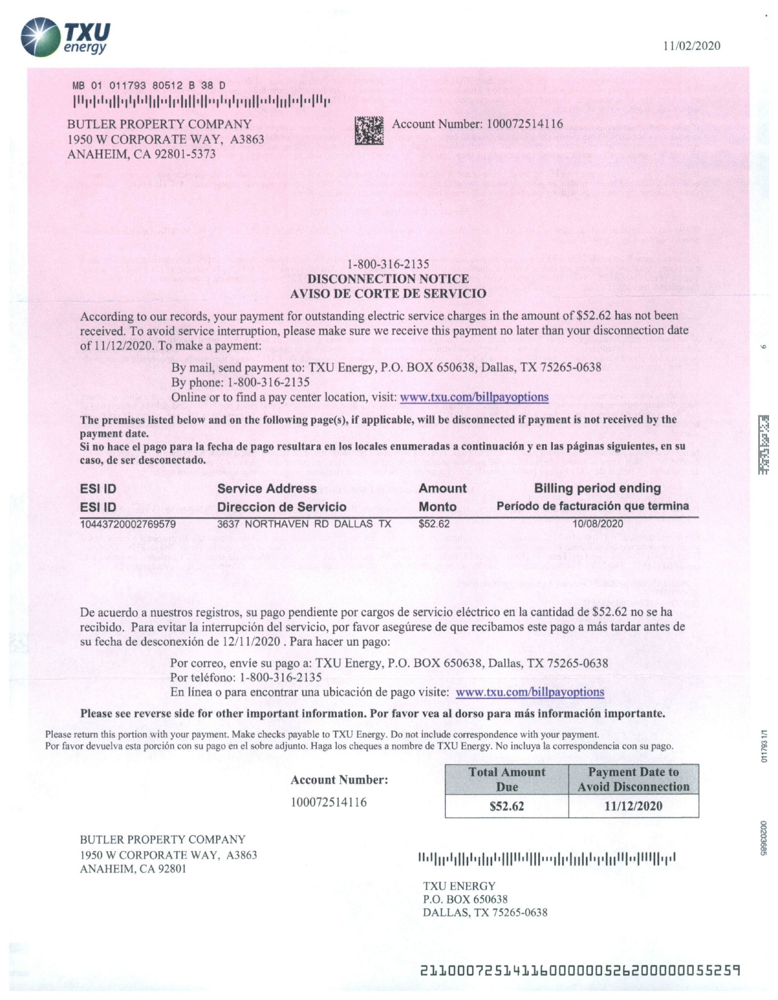

In [31]:
from PIL import Image, ImageDraw, ImageFont

image = Image.open(input_data_png)
image = image.convert("RGB")
image

In [33]:
import json

# with open(input_data_val_json) as f:
#   data = json.load(f)

data = convert_box_json(input_data_boxes, input_data_val_json)

for annotation in data['form']:
  print(annotation)

{'box': [160, 113, 301, 58], 'text': 'TXU', 'label': 'other', 'words': [{'box': [160, 301, 58, 113], 'text': 'TXU'}], 'linking': [], 'id': 0}
{'box': [162, 151, 288, 112], 'text': 'energy', 'label': 'other', 'words': [{'box': [162, 288, 112, 151], 'text': 'energy'}], 'linking': [], 'id': 1}
{'box': [1813, 138, 1965, 109], 'text': '11/02/2020', 'label': 'other', 'words': [{'box': [1813, 1965, 109, 138], 'text': '11/02/2020'}], 'linking': [], 'id': 2}
{'box': [198, 250, 230, 214], 'text': 'MB', 'label': 'other', 'words': [{'box': [198, 230, 214, 250], 'text': 'MB'}], 'linking': [], 'id': 3}
{'box': [249, 250, 274, 214], 'text': '01', 'label': 'other', 'words': [{'box': [249, 274, 214, 250], 'text': '01'}], 'linking': [], 'id': 4}
{'box': [299, 250, 397, 214], 'text': '011793', 'label': 'other', 'words': [{'box': [299, 397, 214, 250], 'text': '011793'}], 'linking': [], 'id': 5}
{'box': [417, 250, 497, 214], 'text': '80512', 'label': 'other', 'words': [{'box': [417, 497, 214, 250], 'text':

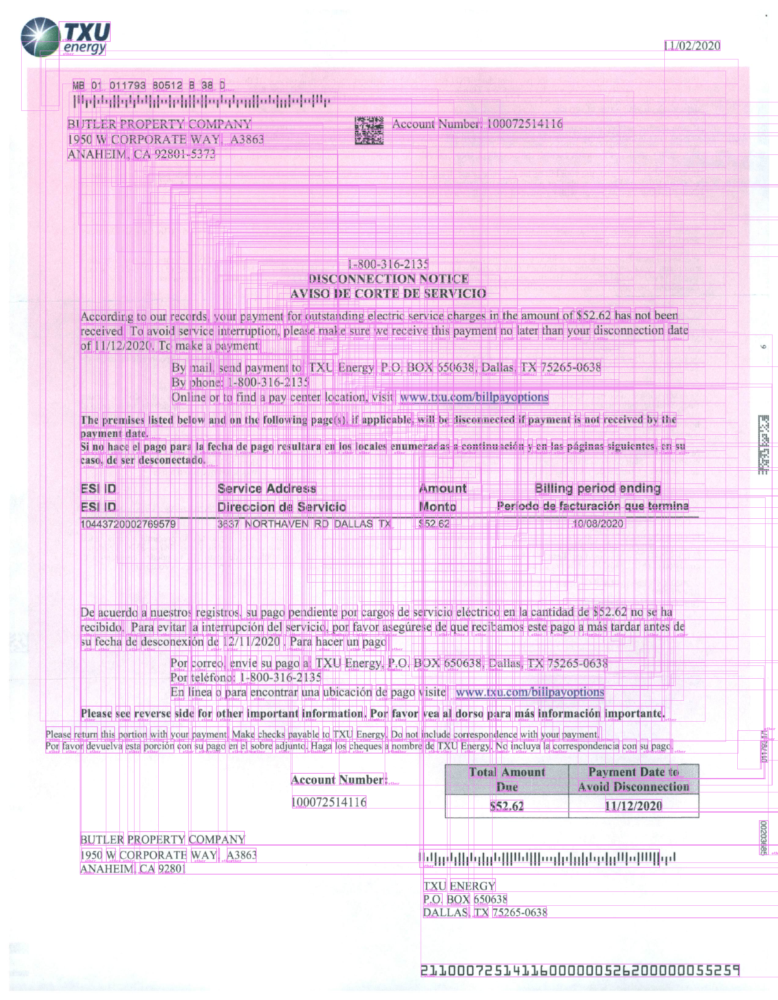

In [39]:
draw = ImageDraw.Draw(image, "RGBA")

font = ImageFont.load_default()

label2color = {'question':'blue', 'total_value':'green', 'header':'orange', 'other':'violet'}

for annotation in data['form']:
  label = annotation['label']
  general_box = annotation['box']
  draw.rectangle(general_box, outline=label2color[label], width=2)
  draw.text((general_box[0] + 10, general_box[1] - 10), label, fill=label2color[label], font=font)
  words = annotation['words']
  for word in words:
    box = word['box']
    draw.rectangle(box, outline=label2color[label], width=1)

image